In [ ]:
  from google.colab import drive
import os
import torch
import cv2
import glob
from google.colab.patches import cv2_imshow
from IPython.display import Image, display

# Google Drive 마운트
drive.mount('/content/drive')

# 작업 디렉토리 설정
os.chdir('/content/drive/MyDrive/swe캡스톤/model')

Mounted at /content/drive


In [ ]:
!pip install ultralytics
!pip install gitpython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 43.5 MB/s eta 0:00:00


In [ ]:
if torch.cuda.is_available():
    print(f"GPU is available: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available")

GPU is available: Tesla T4


In [ ]:
#!mkdir -p spaceDataset
#!curl -L "https://public.roboflow.com/ds/00yNtDXeMM?key=tAEFWy5AP3" > spaceDataset/roboflow.zip; unzip spaceDataset/roboflow.zip -d spaceDataset; rm spaceDataset/roboflow.zip

In [ ]:
#!git clone https://github.com/ultralytics/yolov5.git
#%cd yolov5
#! pip install -r requirements.txt

In [ ]:
# 자리 탐지
!python ./yolov5/train.py --img 640 --batch 64 --epochs 10 --data ./spaceDataset/data.yaml --cfg ./yolov5/models/yolov5s.yaml --weights yolov5s.pt --name parking_slot_results

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-10-29 11:55:28.343333: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-29 11:55:28.362664: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-29 11:55:28.368656: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visual

In [ ]:
# 차량 탐지
!python ./yolov5/train.py --img 640 --batch 64 --epochs 10 --data ./carDataset/data.yaml --cfg ./yolov5/models/yolov5s.yaml --weights yolov5s.pt --name car_detection_results

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.7/877.7 kB 26.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-10-30 06:45:05.814003: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-30 06:45:05.843607: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-30 06:45:05.849551

In [ ]:
# 모델 검증 - 자리 탐지 모델
!python ./yolov5/val.py --weights ./yolov5/runs/train/parking_slot_results2/weights/best.pt --data ./spaceDataset/data.yaml --img 640

val: data=./spaceDataset/data.yaml, weights=['./yolov5/runs/train/parking_slot_results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/swe캡스톤/model/spaceDataset/valid/labels.cache... 2483 images, 59 backgrounds, 0 corrupt: 100% 2483/2483 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 78/78 [02:33<00:00,  1.96s/it]
                   all       2483     143316      0.972      0.958      0.987       0.85
                 empty       2483      73629   

In [ ]:
# 모델 검증 - 차량 탐지 모델
!python ./yolov5/val.py --weights ./yolov5/runs/train/car_detection_results2/weights/best.pt --data ./carDataset/data.yaml --img 640

val: data=./carDataset/data.yaml, weights=['./yolov5/runs/train/car_detection_results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/swe캡스톤/model/carDataset/valid/labels.cache... 314 images, 0 backgrounds, 0 corrupt: 100% 314/314 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/drive/MyDrive/swe캡스톤/model/carDataset/valid/images/20161225_TPZ_00437_jpg.rf.64173289b4a30b3895478449c0f3b989.jpg: 1 duplicate labels removed
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 10/10 [

In [ ]:
# 자리 탐지
image_path = '/content/drive/MyDrive/swe캡스톤/model/spaceDataset/valid/images/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.jpg'
!python ./yolov5/detect.py --weights ./yolov5/runs/train/parking_slot_results2/weights/best.pt --source {image_path} --save-txt

# 차량 탐지
!python ./yolov5/detect.py --weights ./yolov5/runs/train/car_detection_results2/weights/best.pt --source {image_path} --save-txt

detect: weights=['./yolov5/runs/train/parking_slot_results2/weights/best.pt'], source=/content/drive/MyDrive/swe캡스톤/model/spaceDataset/valid/images/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/swe캡스톤/model/spaceDataset/valid/images/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6

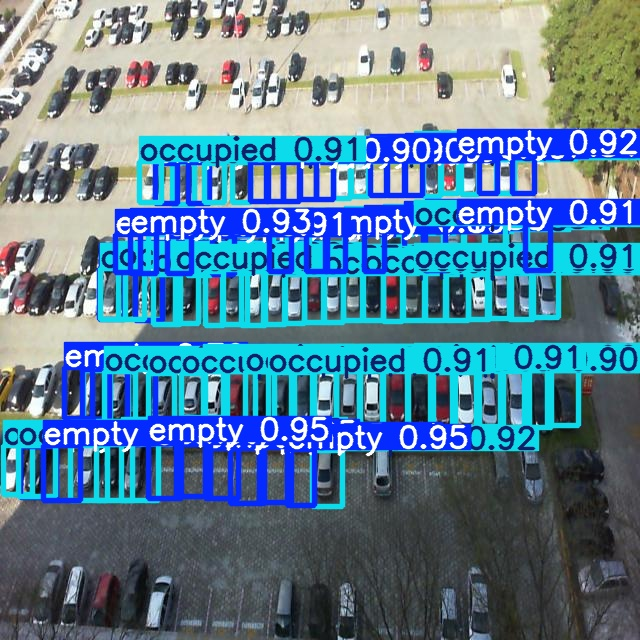

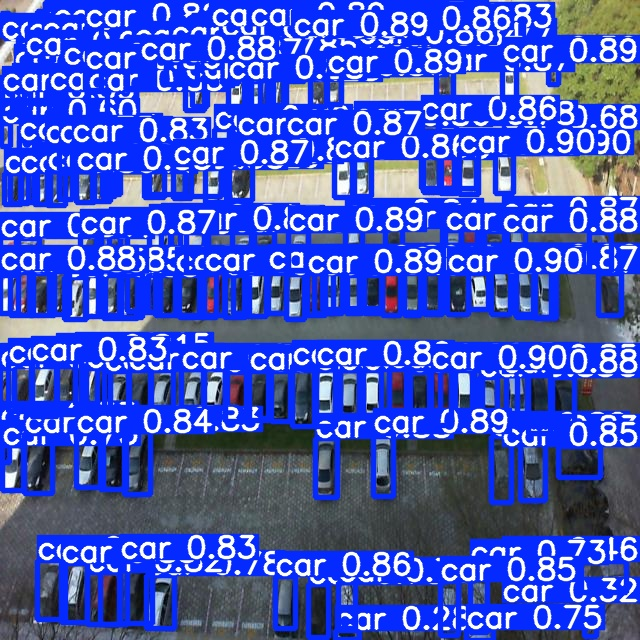

In [ ]:
# 자리 탐지 결과
parking_result_image_path = './yolov5/runs/detect/exp7/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.jpg'
display(Image(filename=parking_result_image_path, width=640))

# 차량 탐지 결과
car_result_image_path = './yolov5/runs/detect/exp8/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.jpg'
display(Image(filename=car_result_image_path, width=640))

Resized image saved to: ./data/testImage2.png
Displaying resized image:


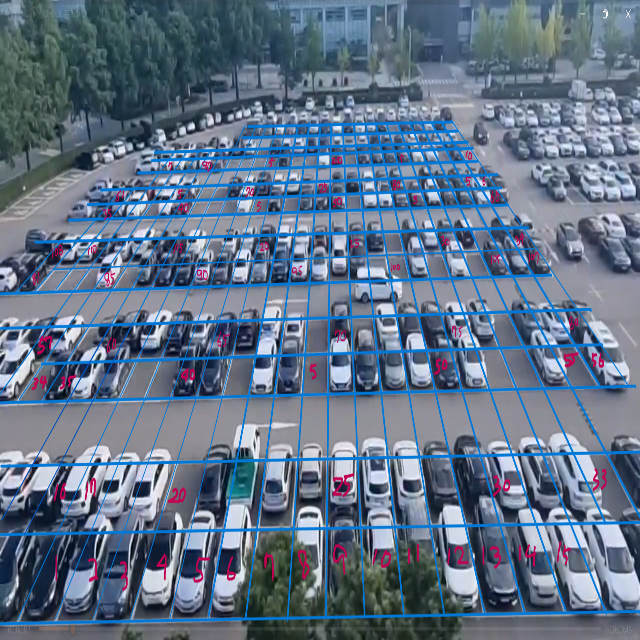

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow


# 이미지 경로 설정 (Google Drive 경로)
image_path = './data/testImage.png'

# 이미지를 불러옴
img = cv2.imread(image_path)

# 이미지가 잘 로드됐는지 확인
if img is not None:
    # 640x640 크기로 리사이즈
    resized_img = cv2.resize(img, (640, 640))

    # 리사이즈된 이미지 저장 경로 설정
    save_path = './data/testImage2.png'

    # 리사이즈된 이미지 저장
    cv2.imwrite(save_path, resized_img)
    print(f"Resized image saved to: {save_path}")

    # 리사이즈된 이미지 보여주기
    print("Displaying resized image:")
    cv2_imshow(resized_img)
else:
    print("Failed to load image.")

In [ ]:
# 자리 탐지
image_path = './data/testImage2.png'
!python ./yolov5/detect.py --weights ./yolov5/runs/train/parking_slot_results2/weights/best.pt --source {image_path} --save-txt

# 차량 탐지
!python ./yolov5/detect.py --weights ./yolov5/runs/train/car_detection_results2/weights/best.pt --source {image_path} --save-txt

detect: weights=['./yolov5/runs/train/parking_slot_results2/weights/best.pt'], source=./data/testImage2.png, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/swe캡스톤/model/data/testImage2.png: 640x640 27 emptys, 2 occupieds, 694.1ms
Speed: 6.3ms pre-process, 694.1ms inference, 2.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp11
1 labels saved to yolov5/runs/detect/exp11/labels

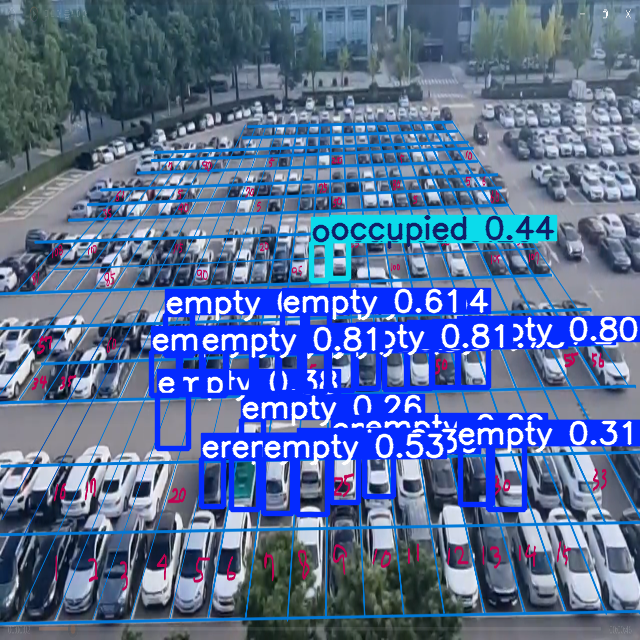

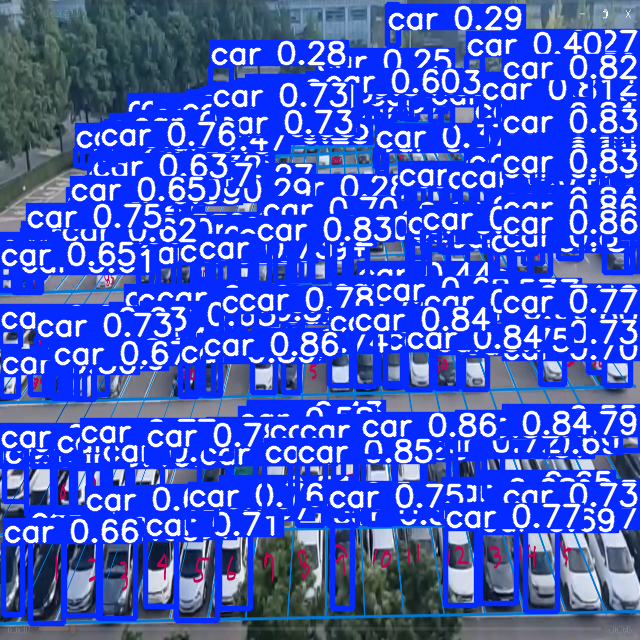

In [ ]:
# 자리 탐지 결과
parking_result_image_path = './yolov5/runs/detect/exp11/testImage2.png'
display(Image(filename=parking_result_image_path, width=640))

# 차량 탐지 결과
car_result_image_path = './yolov5/runs/detect/exp12/testImage2.png'
display(Image(filename=car_result_image_path, width=640))

In [ ]:
import re

# 좌표.txt 불러오기
def parse_coordinates(file_path):
    coordinates = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for i in range(0, len(lines), 6):
            slot_id = int(lines[i].strip())
            bottom_left = re.findall(r"\d+\.\d+", lines[i + 1])
            bottom_right = re.findall(r"\d+\.\d+", lines[i + 2])
            top_left = re.findall(r"\d+\.\d+", lines[i + 3])
            top_right = re.findall(r"\d+\.\d+", lines[i + 4])

            bottom_left = (float(bottom_left[0]), float(bottom_left[1]))
            bottom_right = (float(bottom_right[0]), float(bottom_right[1]))
            top_left = (float(top_left[0]), float(top_left[1]))
            top_right = (float(top_right[0]), float(top_right[1]))

            coordinates.append((slot_id, bottom_left, bottom_right, top_left, top_right))
    return coordinates

# 좌표.txt yolo 형식으로 변환
def convert_to_yolo_format(coordinates, img_width, img_height):
    yolo_data = []
    for slot_id, bottom_left, bottom_right, top_left, top_right in coordinates:
        # 구획의 중심 좌표 및 너비와 높이 계산
        x_min = min(bottom_left[0], bottom_right[0], top_left[0], top_right[0])
        x_max = max(bottom_left[0], bottom_right[0], top_left[0], top_right[0])
        y_min = min(bottom_left[1], bottom_right[1], top_left[1], top_right[1])
        y_max = max(bottom_left[1], bottom_right[1], top_left[1], top_right[1])

        x_center = (x_min + x_max) / 2.0 / img_width
        y_center = (y_min + y_max) / 2.0 / img_height
        width = (x_max - x_min) / img_width
        height = (y_max - y_min) / img_height

        # default class는 0 (Empty)
        yolo_data.append(f"0 {x_center} {y_center} {width} {height}")
    return yolo_data

def save_yolo_data(yolo_data, output_path):
    with open(output_path, 'w') as file:
        for line in yolo_data:
            file.write(f"{line}\n")

coordinate_file = './data/좌표.txt'
output_file = './data/yolo_coordinates.txt'
img_width = 1920
img_height = 1080

coordinates = parse_coordinates(coordinate_file)
yolo_data = convert_to_yolo_format(coordinates, img_width, img_height)
save_yolo_data(yolo_data, output_file)

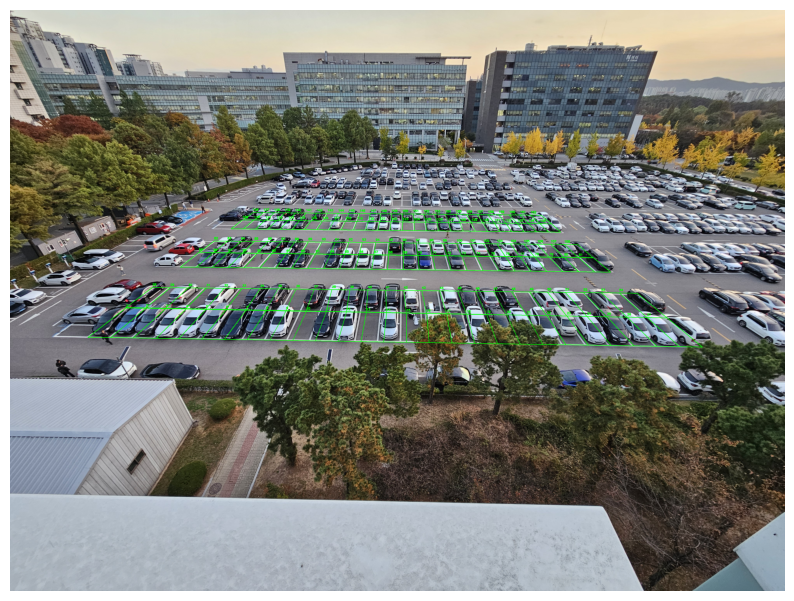

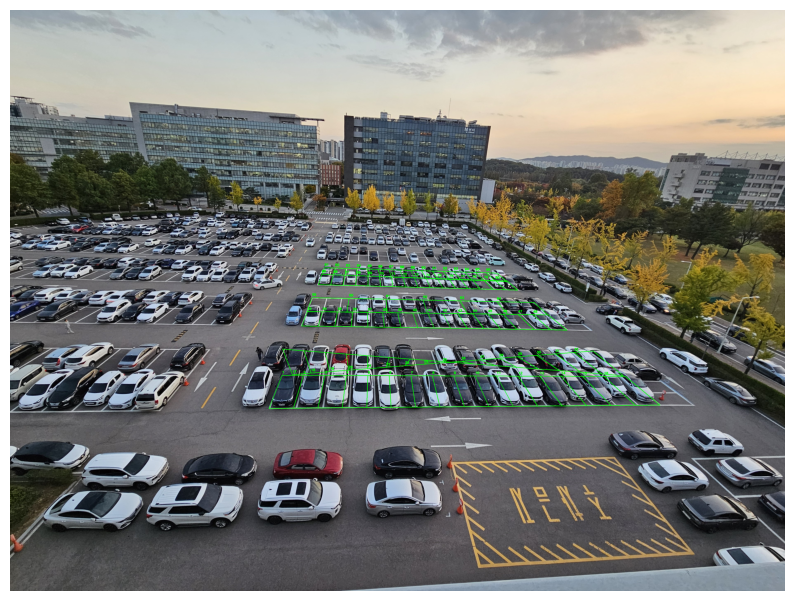

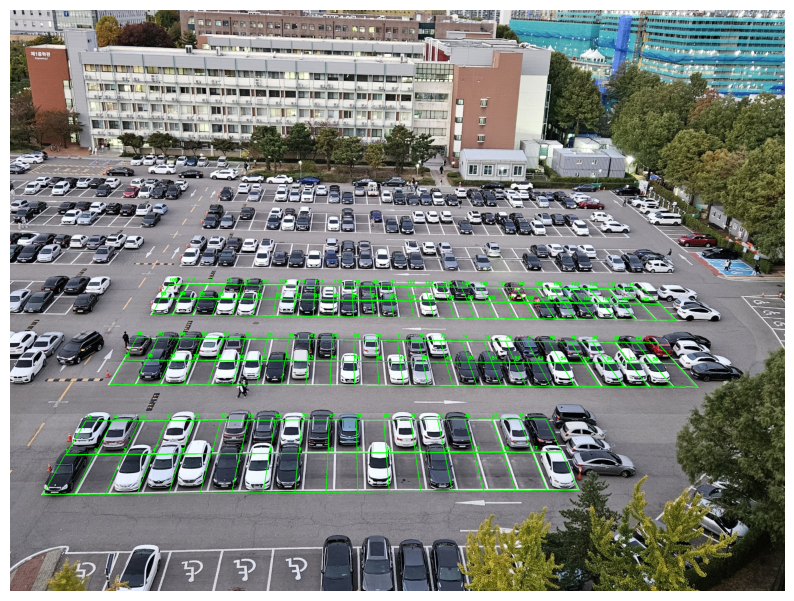

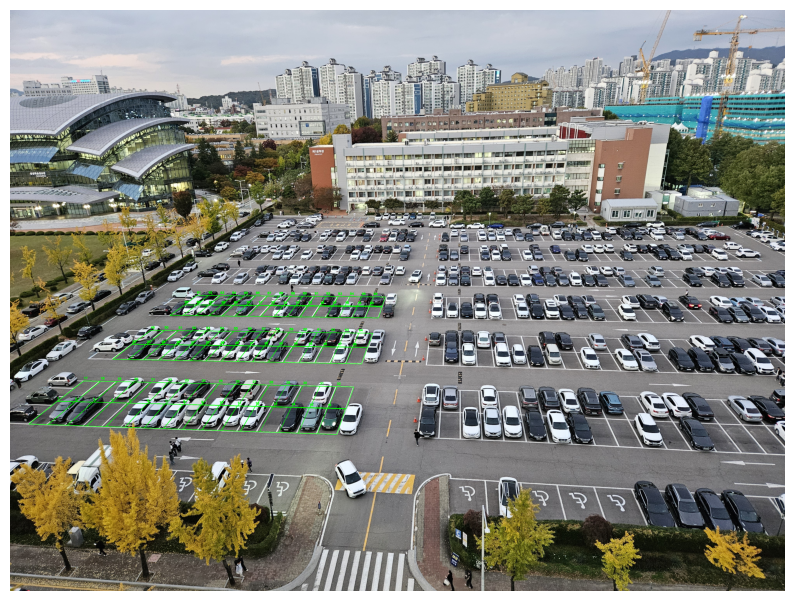

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

img_width = 4000
img_height = 3000

for n in ['1', '2', '3', '4']:
  exec('coordinate_file = \'./data/카메라' + n + ' 좌표.txt\'')
  exec('output_file = \'./data/yolo_coordinates' + n + '.txt\'')
  coordinates = parse_coordinates(coordinate_file)
  yolo_data = convert_to_yolo_format(coordinates, img_width, img_height)
  save_yolo_data(yolo_data, output_file)

  exec('img = cv2.imread(\'./data/' + n + '.jpg\')')

  i = 0
  for slot_id, bottom_left, bottom_right, top_left, top_right in coordinates:
    i += 1
    pts = np.array([[bottom_left[0], bottom_left[1]], [bottom_right[0], bottom_right[1]], [top_right[0], top_right[1]], [top_left[0], top_left[1]]])
    color = (0, 255, 0)
    cv2.polylines(img, np.int32([pts]), True, color, 2)
    cv2.putText(img, str(i), (int(top_left[0]), int(top_left[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  plt.figure(figsize=(10, 10))
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()

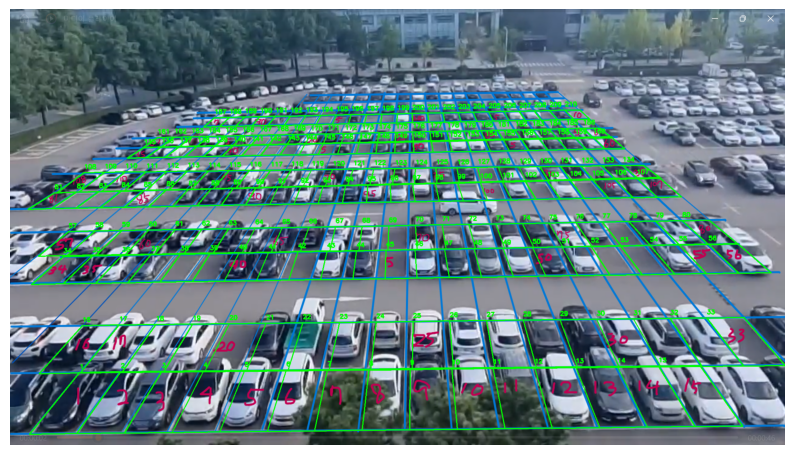

In [ ]:
import matplotlib.pyplot as plt

coordinates = parse_coordinates('./data/좌표.txt')
img = cv2.imread('./data/testImage.png')
i = 0
for slot_id, bottom_left, bottom_right, top_left, top_right in coordinates:
    i += 1
    pts = np.array([[bottom_left[0], bottom_left[1]], [bottom_right[0], bottom_right[1]], [top_right[0], top_right[1]], [top_left[0], top_left[1]]])
    color = (0, 255, 0)
    cv2.polylines(img, np.int32([pts]), True, color, 2)
    cv2.putText(img, str(i), (int(top_left[0]), int(top_left[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
!python ./yolov5/train.py --data ./dataset/data.yaml --weights ./yolov5/runs/train/parking_slot_results2/weights/best.pt --epochs 50

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-11-13 05:01:58.948904: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-13 05:01:58.970120: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-13 05:01:58.976269: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visua

In [ ]:
image_path = './data/1.jpg'
!python ./yolov5/detect.py --weights ./yolov5/runs/train/exp4/weights/best.pt --source {image_path} --save-txt

detect: weights=['./yolov5/runs/train/exp4/weights/best.pt'], source=./data/1.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/swe캡스톤/model/data/1.jpg: 480x640 25 emptys, 116 occupieds, 42.1ms
Speed: 0.7ms pre-process, 42.1ms inference, 1028.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp18
1 labels saved to

In [ ]:
image_path = './data/1.jpg'
!python ./yolov5/detect.py --weights ./yolov5/runs/train/car_detection_results2/weights/best.pt --source {image_path} --save-txt

detect: weights=['./yolov5/runs/train/car_detection_results2/weights/best.pt'], source=./data/1.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/swe캡스톤/model/data/1.jpg: 480x640 215 cars, 32.5ms
Speed: 0.7ms pre-process, 32.5ms inference, 517.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp15
1 labels saved to yolov5/runs/detect/exp15/labels


In [ ]:
!python ./yolov5/train.py --data ./dataset1/data.yaml --weights ./yolov5/runs/train/car_detection_results2/weights/best.pt --epochs 20

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-11-14 08:49:10.008172: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-14 08:49:10.040636: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-14 08:49:10.050323: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visua

In [ ]:
image_path = './data/1.jpg'
!python ./yolov5/detect.py --weights ./yolov5/runs/train/exp6/weights/best.pt --source {image_path} --save-txt

detect: weights=['./yolov5/runs/train/exp6/weights/best.pt'], source=./data/1.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/swe캡스톤/model/data/1.jpg: 480x640 111 cars, 28.0ms
Speed: 0.7ms pre-process, 28.0ms inference, 513.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp16
1 labels saved to yolov5/runs/detect/exp16/labels


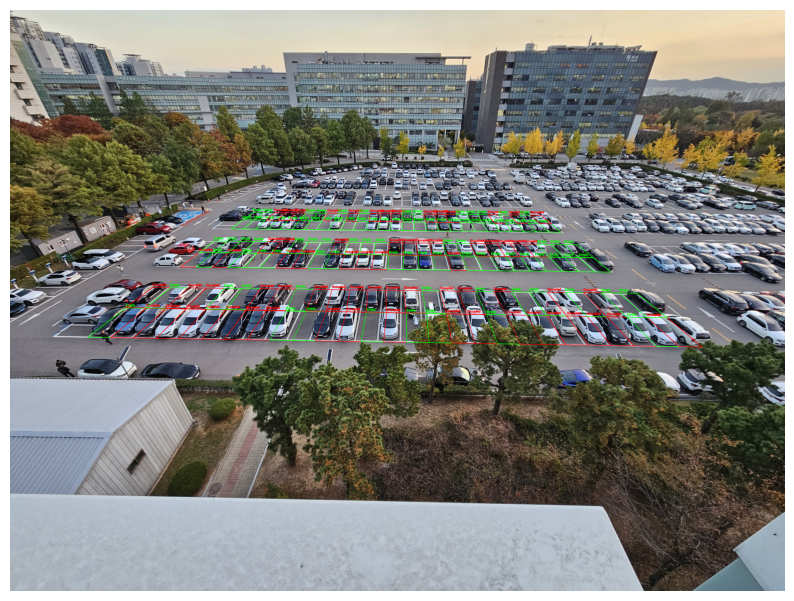

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

def convert_coordinates(coordinates, img_width, img_height):
    converted = []
    for slot_id, bottom_left, bottom_right, top_left, top_right in coordinates:
        bottom_left = (bottom_left[0] / img_width, bottom_left[1] / img_height)
        bottom_right = (bottom_right[0] / img_width, bottom_right[1] / img_height)
        top_left = (top_left[0] / img_width, top_left[1] / img_height)
        top_right = (top_right[0] / img_width, top_right[1] / img_height)
        converted.append((slot_id, bottom_left, bottom_right, top_left, top_right))
    return converted

def load_detections(detection_file):
    detections = []
    with open(detection_file, 'r') as file:
        lines = file.readlines()
        for line in lines:
            parts = line.strip().split()
            slot_class = np.int32(parts[0])
            center_x = np.float32(parts[1])
            center_y = np.float32(parts[2])
            detections.append((slot_class, center_x, center_y))
    return detections

def check_parking_status(coordinates, car_detection_file, image_path, labels):
    img = cv2.imread(image_path)
    #space_detections = load_detections(space_detection_file)
    car_detections = load_detections(car_detection_file)

    for slot_id, bottom_left, bottom_right, top_left, top_right in coordinates:
        bottom_left = (bottom_left[0] * img.shape[1], bottom_left[1] * img.shape[0])
        bottom_right = (bottom_right[0] * img.shape[1], bottom_right[1] * img.shape[0])
        top_left = (top_left[0] * img.shape[1], top_left[1] * img.shape[0])
        top_right = (top_right[0] * img.shape[1], top_right[1] * img.shape[0])
        poly_list = [bottom_left, bottom_right, top_right, top_left]
        polygon = Polygon(poly_list)

        is_occupied = False

        for (slot_class, center_x, center_y) in car_detections:
            center_x *= img.shape[1]
            center_y *= img.shape[0]
            if polygon.contains(Point(center_x, center_y)):
                is_occupied = True
                break

        color = (0, 255, 0) if not is_occupied else (0, 0, 255)
        status_text = "Empty" if not is_occupied else "Occupied"

        pts = np.array([[bottom_left[0], bottom_left[1]], [bottom_right[0], bottom_right[1]], [top_right[0], top_right[1]], [top_left[0], top_left[1]]])
        cv2.polylines(img, np.int32([pts]), True, color, 2)
        cv2.putText(img, status_text, (int(top_left[0]), int(top_left[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        labels.append(is_occupied)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


labels = []
coordinates = parse_coordinates('./data/카메라1좌표.txt')
coordinates = convert_coordinates(coordinates, 4000, 3000)
#space_detection_file = './yolov5/runs/detect/exp18/labels/1.txt'
car_detection_file = './yolov5/runs/detect/exp16/labels/1.txt'
image_path = './data/1.jpg'

check_parking_status(coordinates, car_detection_file, image_path, labels)


In [ ]:
def load_detections_full(filename):
    coordinates = []
    with open(filename, 'r') as file:
        lines = file.readlines()
        for line in lines:
            parts = line.strip().split()
            x = np.float32(parts[1])
            y = np.float32(parts[2])
            width = np.float32(parts[3])
            height = np.float32(parts[4])
            coordinates.append((x, y, width, height))
    return coordinates

img = cv2.imread(image_path)
car_detections = load_detections_full(car_detection_file)

car_detections[0]

(0.142188, 0.765625, 0.05, 0.06875)

In [ ]:
import math

def find_nearest_parking_slot(parking_slots, car_coordinates):
    min_distance = float('inf')
    nearest_parking_slot = None

    for slot_id, bottom_left, bottom_right, top_left, top_right in parking_slots:
        parking_center_x = (bottom_left[0] + bottom_right[0]) / 2
        parking_center_y = (bottom_left[1] + top_left[1]) / 2

        car_center_x = car_coordinates[0]
        car_center_y = car_coordinates[1]

        distance = math.sqrt((parking_center_x - car_center_x)**2 + (parking_center_y - car_center_y)**2)

        if distance < min_distance:
            min_distance = distance
            nearest_parking_slot = (slot_id, bottom_left, bottom_right, top_left, top_right)

    return nearest_parking_slot

nearest_parking_slot = []
for car_coordinates in car_detections:
  nearest_parking_slot.append(find_nearest_parking_slot(coordinates, car_coordinates))

print(nearest_parking_slot[0])

(17, (0.09097395833333333, 0.8350833333333333), (0.14444270833333334, 0.8340555555555556), (0.14065625, 0.7248981481481481), (0.188078125, 0.7238703703703704))


In [ ]:
from math import sqrt

def determine_car_direction(car_coordinates):
    # car_coordinates: (x, y, width, height)
    width = car_coordinates[2]
    height = car_coordinates[3]

    if width > height:
        return "horizontal"  # 횡이동
    else:
        return "vertical"  # 종이동

def is_car_larger_than_parking_slot(car_coordinates, parking_slot, car_direction):
    # car_coordinates: (x, y, width, height)
    # parking_slot: (slot_id, bottom_left, bottom_right, top_left, top_right)

    car_width = car_coordinates[2]
    car_height = car_coordinates[3]

    parking_width = sqrt((parking_slot[1][0] - parking_slot[2][0])**2 + (parking_slot[1][1] - parking_slot[2][1])**2)  # bottom_left - bottom_right
    parking_height = sqrt((parking_slot[1][0] - parking_slot[3][0])**2 + (parking_slot[1][1] - parking_slot[3][1])**2)  # bottom_left - top_left

    if car_direction == "horizontal":
        return car_width > parking_height  # 횡이동: 자동차 width와 주차장 height 비교
    else:
        return car_height > parking_height  # 종이동: 자동차 height와 주차장 width 비교

is_car_larger_than_parking_slot(car_detections[1], nearest_parking_slot[1], determine_car_direction(car_detections[1]))

False

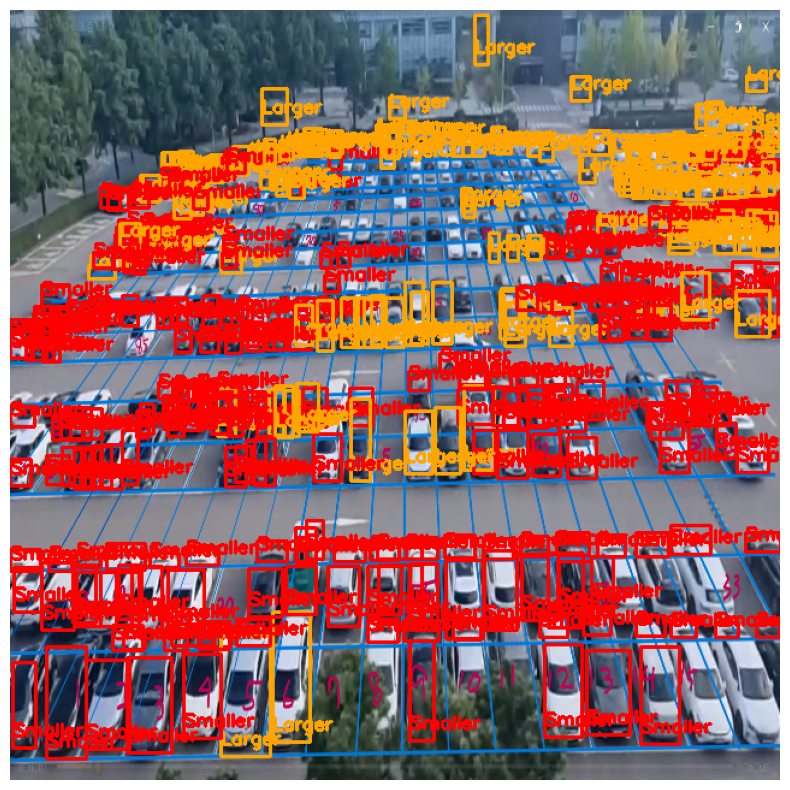

In [ ]:
def check_car_size(car_detections, image_path):
    img = cv2.imread(image_path)

    nearest_parking_slot = []
    for car_coordinates in car_detections:
            nearest_parking_slot.append(find_nearest_parking_slot(coordinates, car_coordinates))

    i = 0
    for center_x, center_y, width, height in car_detections:
        center_x *= img.shape[1]
        center_y *= img.shape[0]
        width *= img.shape[1]
        height *= img.shape[0]
        is_larger = False

        if is_car_larger_than_parking_slot(car_detections[i], nearest_parking_slot[i], determine_car_direction(car_detections[i])):
            is_larger = True
        i += 1

        color = (0, 165, 255) if is_larger else (0, 0, 255)
        status_text = "Larger" if is_larger else "Smaller"

        top_left = (int(center_x - width / 2), int(center_y + height / 2))
        bottom_right = (int(center_x + width / 2), int(center_y - height / 2))
        cv2.rectangle(img, top_left, bottom_right, color, 2)
        cv2.putText(img, status_text, (int(top_left[0]), int(top_left[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

car_detections = load_detections_full(car_detection_file)
image_path = './data/testImage2.png'
check_car_size(car_detections, image_path)

In [ ]:
len(labels)

210

In [ ]:
import firebase_admin
from firebase_admin import credentials, firestore

cred = credentials.Certificate("/content/drive/MyDrive/swe캡스톤/model/skkuparkinglot-firebase-adminsdk-rzwam-4fcb729edc.json")
firebase_admin.initialize_app(cred)
db = firestore.client()

doc_ref = db.collection("vacant").document("SectorA")

def set_field(id_number, new_value):
    if 1 <= id_number <= 280:  # Ensure id_number is within the valid range
        field_name = f"id_{id_number}"
        doc_ref.update({field_name: new_value})
        print(f"Field {field_name} updated to {new_value}.")
    else:
        print("Invalid id_number. Please use a number between 1 and 280.")

ValueError: The default Firebase app already exists. This means you called initialize_app() more than once without providing an app name as the second argument. In most cases you only need to call initialize_app() once. But if you do want to initialize multiple apps, pass a second argument to initialize_app() to give each app a unique name.

In [ ]:
for i, label in enumerate(labels):
  if (label):
    set_field(i + 1, 1)
  else:
    set_field(i + 1, 0)

Field id_1 updated to 1.
Field id_2 updated to 1.
Field id_3 updated to 1.
Field id_4 updated to 1.
Field id_5 updated to 1.
Field id_6 updated to 1.
Field id_7 updated to 0.
Field id_8 updated to 0.
Field id_9 updated to 1.
Field id_10 updated to 0.
Field id_11 updated to 0.
Field id_12 updated to 1.
Field id_13 updated to 1.
Field id_14 updated to 1.
Field id_15 updated to 0.
Field id_16 updated to 1.
Field id_17 updated to 1.
Field id_18 updated to 1.
Field id_19 updated to 1.
Field id_20 updated to 1.
Field id_21 updated to 1.
Field id_22 updated to 1.
Field id_23 updated to 1.
Field id_24 updated to 1.
Field id_25 updated to 1.
Field id_26 updated to 1.
Field id_27 updated to 1.
Field id_28 updated to 1.
Field id_29 updated to 1.
Field id_30 updated to 1.
Field id_31 updated to 1.
Field id_32 updated to 1.
Field id_33 updated to 1.
Field id_34 updated to 1.
Field id_35 updated to 1.
Field id_36 updated to 1.
Field id_37 updated to 0.
Field id_38 updated to 0.
Field id_39 updated t

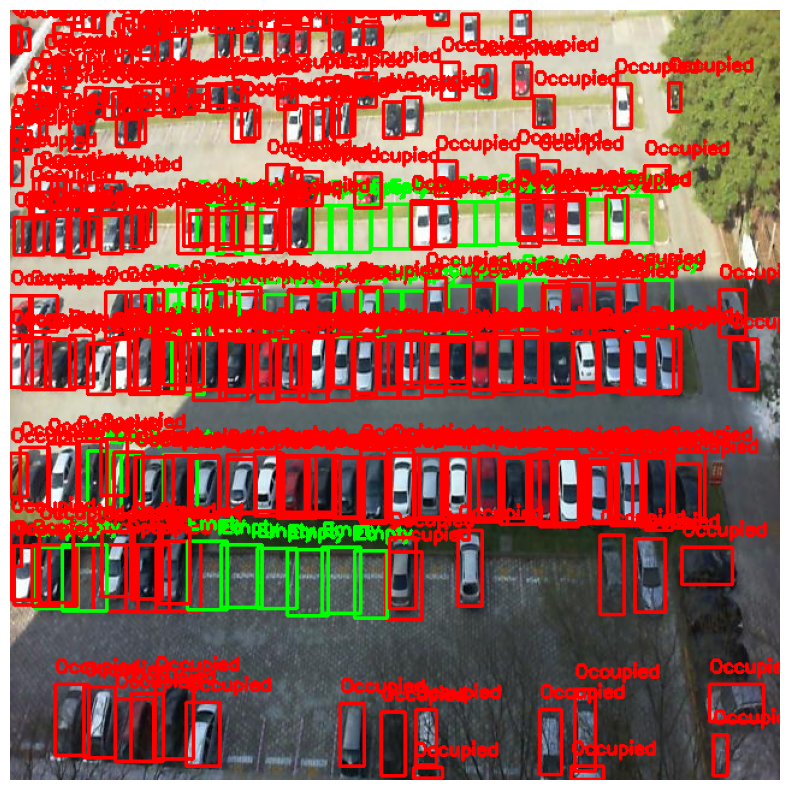

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def check_parking_status(space_detection_file, car_detection_file, image_path):
    img = cv2.imread(image_path)

    with open(space_detection_file, 'r') as f:
        space_labels = f.readlines()

    with open(car_detection_file, 'r') as f:
        car_labels = f.readlines()

    space_detections = []
    car_detections = []

    for label in space_labels:
        slot_class, center_x, center_y, width, height = map(float, label.strip().split())
        center_x *= img.shape[1]
        center_y *= img.shape[0]
        width *= img.shape[1]
        height *= img.shape[0]
        x1 = center_x - (width / 2)
        y1 = center_y - (height / 2)
        x2 = center_x + (width / 2)
        y2 = center_y + (height / 2)

        space_detections.append([int(slot_class), (int(x1), int(y1)), (int(x2), int(y2))])

    for label in car_labels:
        slot_class, center_x, center_y, width, height = map(float, label.strip().split())
        center_x *= img.shape[1]
        center_y *= img.shape[0]
        width *= img.shape[1]
        height *= img.shape[0]
        x1 = center_x - (width / 2)
        y1 = center_y - (height / 2)
        x2 = center_x + (width / 2)
        y2 = center_y + (height / 2)

        car_detections.append([int(slot_class), (int(x1), int(y1)), (int(x2), int(y2))])

    for slot_class, a, b in space_detections:
        status = "Occupied" if slot_class else "Empty"

        color = (0, 255, 0) if not slot_class else (0, 0, 255)
        status_text = "Empty" if not slot_class else "Occupied"

        cv2.rectangle(img, a, b, color, 2)
        cv2.putText(img, status_text, (a[0], a[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    for slot_class, a, b in car_detections:
        status = "Occupied"

        color = (0, 0, 255)
        status_text = "Occupied"

        cv2.rectangle(img, a, b, color, 2)
        cv2.putText(img, status_text, (a[0], a[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

space_detection_file = './yolov5/runs/detect/exp7/labels/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.txt'  # 자리 탐지 라벨 파일 경로
car_detection_file = './yolov5/runs/detect/exp8/labels/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.txt'   # 차량 탐지 라벨 파일 경로
image_path = '/content/drive/MyDrive/swe캡스톤/model/spaceDataset/valid/images/2012-09-11_15_36_32_jpg.rf.b2b1767cafabff6378468d0d71c1ecd2.jpg'
check_parking_status(space_detection_file, car_detection_file, image_path)

In [ ]:
image_path = './data/1.jpg'
model(img)